In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

## Final Topic Assignment

In [2]:
#Clustered tweets
df = pd.read_csv('/kaggle/input/us-senate-analysis/dataset_with_topics.csv')
df.head()

,date,id,username,text,retweets,likes,topic_1500,topic_500,topic_150
0,2010-08-31 16:13:03,22629609170,TTuberville,Hope to see the Raider nation at Raider Walk t...,6,0,-1,-1,-1
1,2010-09-02 15:12:21,22806173687,TTuberville,Be there tonight at Ruby Tequila's from 6 to 7...,4,0,-1,-1,-1
2,2010-09-03 14:59:11,22894114050,TTuberville,Thanks for coming out to the show last night.....,0,0,-1,-1,-1
3,2010-09-04 16:58:53,22990051461,TTuberville,Raider Power tv show starts today and througho...,6,0,-1,-1,-1
4,2010-09-04 20:55:56,23004266274,TTuberville,Wear Red and see all of you fans at RAIDER WAL...,4,1,-1,-1,-1


In [3]:
# Topic list manually made
topics = pd.read_csv('/kaggle/input/us-senate-analysis/topic_info_150.csv').iloc[:,0:4]
topics.head()

,Topic,Count,Name,topic_assigned
0,-1,88128,-1_the_to_and_of,Unclassified
1,0,7206,0_climate_energy_oil_gas,Climate Change
2,1,5854,1_border_southern border_southern_the border,Security
3,2,5319,2_honor_who_service_our,National Issues
4,3,4961,3_abortion_reproductive_roe_right to,Social Issues


In [4]:
# Senators info
senators = pd.read_csv('/kaggle/input/us-senate-analysis/us_senators.csv')
senators.loc[senators["Party"].isin(['Independent[d]','Independent[n]', 'Democratic (DFL)[p]']), "Party"] = "Democratic"
senators.head()

,State,Senator,Party,Born,Occupation(s),Previous elective office(s),Education,Assumed office,Class,Residence[1],id,name,screen_name,location,followers_count,friends_count,x,y
0,Alabama,Tommy Tuberville,Republican,(age 68),College football coach Investment management f...,None,Southern Arkansas University (BS),3-Jan-21,2026 Class 2,Auburn[2],1.107981e+08,Tommy Tuberville,TTuberville,"Alabama, USA",77306,745,33.220641,-86.868870
1,Alabama,Katie Britt,Republican,(age 41),Senate staffer University administrator Lawyer...,None,"University of Alabama (BS, JD)",3-Jan-23,2028 Class 3,Montgomery,1.400920e+18,Katie Britt for AL,KatieBrittforAL,NaN,21965,2,33.635132,-86.692190
2,Alaska,Lisa Murkowski,Republican,(age 65),Lawyer,Alaska House of Representatives,Georgetown University (AB) Willamette Universi...,"December 20, 2002[c]",2028 Class 3,Girdwood,1.512476e+08,Lisa Murkowski,LisaForSenate,Alaska,9238,479,57.865400,-152.882373
3,Alaska,Dan Sullivan,Republican,(age 58),U.S. Marine Corps officer Lawyer Assistant Sec...,Alaska Attorney General,Harvard University (AB) Georgetown University ...,3-Jan-15,2026 Class 2,Anchorage,1.869975e+09,Dan Sullivan,DanSullivan_AK,"Anchorage, AK",4928,577,64.069195,-141.940302
4,Arizona,Kyrsten Sinema,Democratic,(age 46),Social worker Political activist Lawyer Colleg...,U.S. House Arizona Senate Arizona House of Rep...,Brigham Young University (BA) Arizona State Un...,3-Jan-19,2024 Class 1,Phoenix,1.080845e+09,Kyrsten Sinema,SenatorSinema,NaN,200953,724,34.676197,-113.888926


Merge df and topics to get the topics

In [5]:
df = df.merge(topics, left_on='topic_150', right_on='Topic')
df.head()

,date,id,username,text,retweets,likes,topic_1500,topic_500,topic_150,Topic,Count,Name,topic_assigned
0,2010-08-31 16:13:03,22629609170,TTuberville,Hope to see the Raider nation at Raider Walk t...,6,0,-1,-1,-1,-1,88128,-1_the_to_and_of,Unclassified
1,2010-09-02 15:12:21,22806173687,TTuberville,Be there tonight at Ruby Tequila's from 6 to 7...,4,0,-1,-1,-1,-1,88128,-1_the_to_and_of,Unclassified
2,2010-09-03 14:59:11,22894114050,TTuberville,Thanks for coming out to the show last night.....,0,0,-1,-1,-1,-1,88128,-1_the_to_and_of,Unclassified
3,2010-09-04 16:58:53,22990051461,TTuberville,Raider Power tv show starts today and througho...,6,0,-1,-1,-1,-1,88128,-1_the_to_and_of,Unclassified
4,2010-09-04 20:55:56,23004266274,TTuberville,Wear Red and see all of you fans at RAIDER WAL...,4,1,-1,-1,-1,-1,88128,-1_the_to_and_of,Unclassified


In [6]:
# Clean
df.drop(['topic_1500', 'topic_500', 'Topic', 'Name', 'id'], axis=1, inplace =True)

Merge df and senators to get the name, party and state


In [7]:
# reduce senators dataset
senators = senators[['Party', 'screen_name', 'Senator',"followers_count","friends_count","x","y","State", "name"]]
df = df.merge(senators, left_on='username', right_on='screen_name')
df.head()

,date,username,text,retweets,likes,topic_150,Count,topic_assigned,Party,screen_name,Senator,followers_count,friends_count,x,y,State,name
0,2010-08-31 16:13:03,TTuberville,Hope to see the Raider nation at Raider Walk t...,6,0,-1,88128,Unclassified,Republican,TTuberville,Tommy Tuberville,77306,745,33.220641,-86.86887,Alabama,Tommy Tuberville
1,2010-09-02 15:12:21,TTuberville,Be there tonight at Ruby Tequila's from 6 to 7...,4,0,-1,88128,Unclassified,Republican,TTuberville,Tommy Tuberville,77306,745,33.220641,-86.86887,Alabama,Tommy Tuberville
2,2010-09-03 14:59:11,TTuberville,Thanks for coming out to the show last night.....,0,0,-1,88128,Unclassified,Republican,TTuberville,Tommy Tuberville,77306,745,33.220641,-86.86887,Alabama,Tommy Tuberville
3,2010-09-04 16:58:53,TTuberville,Raider Power tv show starts today and througho...,6,0,-1,88128,Unclassified,Republican,TTuberville,Tommy Tuberville,77306,745,33.220641,-86.86887,Alabama,Tommy Tuberville
4,2010-09-04 20:55:56,TTuberville,Wear Red and see all of you fans at RAIDER WAL...,4,1,-1,88128,Unclassified,Republican,TTuberville,Tommy Tuberville,77306,745,33.220641,-86.86887,Alabama,Tommy Tuberville


In [8]:
df.to_csv('final_results.csv', index=False)

# Data Analysis

In [9]:
# Most Popular Tweets By RTs
df.sort_values('retweets', ascending=False)[['Senator', 'text', 'retweets', 'likes', 'topic_assigned', 'topic_150']].head(5)

,Senator,text,retweets,likes,topic_assigned,topic_150
208702,Mitt Romney,"Unprecedented, historic corruption: an Americ...",130218,544767,Unclassified,-1
209603,Mitt Romney,"No, not the same. One side is racist, bigoted,...",85503,295616,International Politics,73
208950,Mitt Romney,https://t.co/S3kFsIRGmi,80360,484998,Others,8
210269,Bernie Sanders,The business model of Wall Street is fraud.,73461,580376,Unclassified,-1
55748,Tammy Duckworth,70% of Americans believe Roe v. Wade should re...,71876,98202,Social Issues,3


## Most popular tweet by Rt
**Mitt Romney** 

*Unprecedented, historic corruption:  an American president commutes the sentence of a person convicted by a jury of lying to shield that very president.*

*   130218 rt
*   544767 likes

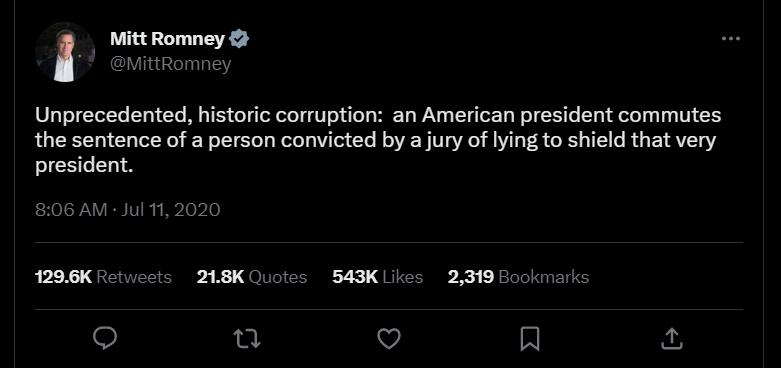

In [10]:
# Most Popular Tweets By Like
df.sort_values('likes', ascending=False)[['Senator', 'text', 'retweets','likes', 'topic_assigned', 'topic_150']].head(5)

,Senator,text,retweets,likes,topic_assigned,topic_150
182483,John Fetterman,It's official. I will be the next U.S. Senator...,56459,596023,National Issues,54
210269,Bernie Sanders,The business model of Wall Street is fraud.,73461,580376,Unclassified,-1
208702,Mitt Romney,"Unprecedented, historic corruption: an Americ...",130218,544767,Unclassified,-1
208950,Mitt Romney,https://t.co/S3kFsIRGmi,80360,484998,Others,8
208701,Mitt Romney,Black Lives Matter. https://t.co/JpXUFlxH2J,53767,463466,Unclassified,-1


## Most popular tweet by likes

**John Fetterman**

*It's official. I will be the next U.S. Senator from Pennsylvania.
We bet on the people of Pennsylvania - and you didn’t let us down. And I won’t let you down. Thank you.*

*   56459 rt
*   596023 likes


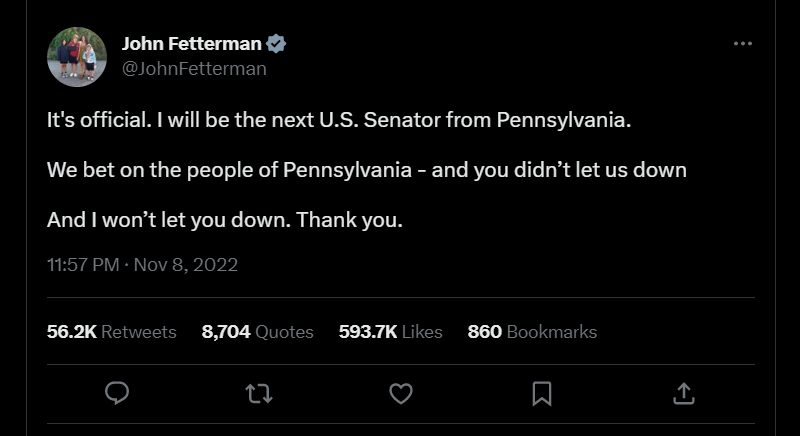



##Topics

### Topics per Party

**Histogram of Topics by Party**

The quantity of tweets is shown in this graph by topic. National issues is the most discussed subject due to including local issues. Since the US is geographically diverse, there are several distinct regions and particular issues. Additionally, the concern senators have for their home state contributes significantly to the rise in tweets.

In the histogram, we observe that some topics break the inequality. The Republicans publish more about Economy, International Politics and Security. Democrats tweet more frequently on Climate Change, Public Health and Social Issues.

There are significant differences between some of these issues. For instance, Republican senators tweet about international politics more than three times  than Democrats do. Democrats tweet about social issues 87% more than Republicans. Democrats appear to be focusing on public health and elections, where they nearly double the number of Republican tweets.

Although it is one of the topics with the lowest representation, religion is predominantly a Republican theme, accounting for 97% of the database tweets.

In [11]:
x = df.loc[(df.Party.isin(['Democratic', 'Republican']) & (df.topic_assigned != 'Unclassified'))]

fig = px.histogram(x, x='topic_assigned', color='Party', nbins=len(x['topic_assigned'].unique()), 
                   color_discrete_sequence=['#1f77b4', '#d62728'], category_orders={'Party': ['Democratic', 'Republican']})
fig.update_layout(barmode='group', xaxis={'categoryorder':'array', 'categoryarray':sorted(x['topic_assigned'].unique())},
                  bargap=0.5, bargroupgap=0.1, 
                  xaxis_title='Topic', yaxis_title='Number of Tweets', 
                  )
fig.update_traces(marker_line_width=0.2)
fig.show()

In [12]:
def pie_chart(df,str = ""):
  x = df.loc[(df.topic_assigned != 'Unclassified')&(df.topic_assigned != 'Others')]
  x = x[["text","topic_assigned"]]
  x=x.groupby("topic_assigned").count()
  x = x.rename(columns={'text': 'count'})
  fig = px.pie(x, values=x["count"], 
              names=x.index)
  fig.show()
pie_chart(df)

def bar_chart(df):
  x = df.loc[(df.topic_assigned != 'Unclassified')&(df.topic_assigned != 'Others')]
  fig = px.histogram(x, x=x.topic_assigned, color='Party',
                     nbins=len(x['topic_assigned'].unique()))
  fig.update_layout( xaxis={'categoryorder':'array', 'categoryarray':sorted(x['topic_assigned'].unique())},
                  xaxis_title='Topic', yaxis_title='Number of Tweets', 
                  )
  fig.show()
#bar_chart(df)

In the figures below we compare the topic count for each topic in both parties. We can see that in both parties the National issues is the topic with most published topics with a big difference to the rest of the topics. 

For the Republicans more than the 50% of the published tweets are related to National Issues, Security  International Politics, Social Issues and Economics.

In contrast, half of the Democrat tweets are related to National Issues, Social Issues, Security, Public Health and Climate Change. 

In [13]:
republican_tweets= df[df.Party =="Republican"]
democratic_tweets = df[df.Party =="Democratic"]
pie_chart(republican_tweets)
x = republican_tweets.loc[(republican_tweets.topic_assigned != 'Unclassified')&(republican_tweets.topic_assigned != 'Others')]
fig = px.histogram(x, x=x.topic_assigned, color='Party',
                     color_discrete_sequence = ['#d62728'],
                    nbins=len(x['topic_assigned'].unique()))
fig.update_layout( xaxis={'categoryorder':'array', 'categoryarray':sorted(x['topic_assigned'].unique())},
                xaxis_title='Topic', yaxis_title='Number of Tweets', 
                )
fig.show()

In [14]:
pie_chart(democratic_tweets)
bar_chart(democratic_tweets)

### Topics over time

The evolution of the number of tweets published over time, sorted  by topic, is shown in the following graph. 

*   National Issues and Elections

Focusing just on National Issues and Elections, we notice that there is a high correlation. The lines show peaks of tweets every two years, specially on October. This is not surprising, considering that the elections in the US are in November every two years. Therefore, the figure is key to remark the importance of the local concerns in the previous months of the elections. 


*   Public health

We can visualize a huge peak in March 2020, produced by the Covid-19 pandemic.After that we see that the number of tweets about health remains higher than before. The line tendency is quite interesting. Before covid it was a residual topic, and after the peak the behaviour is still unstable and with smaller peaks that we believed could be due to new Covid waves. However, currently there mean number of tweets is still higher than before March 2023, which could lead to interpret that senators have added Public Health to their social media strategy. 


*   International Politics

International politics only has two clear increases in August 2021 and in March 2022. The first peak is coincident with the Afghanistan's government defeat and the last peak was caused by the Ukranian and Rusia war that started in February 24th. 

It is also noticeable that the outliers (labeled as "Unclassified") tend to follow National Issues. This could be because some tweets only contain pictures, links or answers to other topics but the model could no appreciate that.



In [15]:
df['date'] = pd.to_datetime(df['date']) # Convert date column to datetime format
x = df.groupby([pd.Grouper(key='date', freq='M'), 'topic_assigned']).count().reset_index()

fig = px.line(x, x='date', y='text', color='topic_assigned',
              labels={
                     "date": "Time",
                     "text": "Number of tweets",
                      "topic_assigned": "Topic"
                 })
fig.show()

This one exposes the percentage of the tweets of each topic, relative to the number of total tweets of the topic. It helps to reduce the imbalance of data and see the real impact over time of the topics

In [16]:
### Topics per month
df['date'] = pd.to_datetime(df['date'])
topics_month = df.groupby([pd.Grouper(key='date', freq='M'), 'topic_assigned']).count().reset_index()
topics_month.rename(columns={'text': 'count'}, inplace=True)

### Total number of tweets of a topic
total_counts = df['topic_assigned'].value_counts().to_dict()

topics_month['percentage'] = topics_month.apply(lambda row: row['count'] / total_counts[row['topic_assigned']], axis=1)

# Plot a line graph with the percentage of tweets for each topic assigned
fig = px.line(topics_month, x="date", y="percentage", color="topic_assigned",
              labels={
                     "date": "Time",
                     "percentage": "Percentage of tweets, relative to the total amount of tweets",
                     "topic_assigned": "Topic"
                 })
fig.show()

In the figures below, we present the distribution of tweets by year and colored by topic. It is easy to see that the number of tweets from 2020 in advance is higher than in the previous years. We find several reasons for it

- The senators politic influence started in recent years when their political career started to grow so they went public afterwards.

- Deleted tweets from previous years. This cleaning process is common between famous people, and politicians are not an exception.

- Limitations on the tweet gathering process.

In [17]:
df['date'] = pd.to_datetime(df['date'])
# df['year'] = df['date'].dt.year  # Add a new 'year' column

topics_year = df.loc[(df.topic_assigned != 'Unclassified')&(df.topic_assigned != 'Others')]
topics_year = topics_year.groupby([pd.Grouper(key='date', freq='Y'), 'topic_assigned']).count().reset_index()

# x = x.sort_values(by='date', ascending=True) # Sort by date in ascending order
topics_year['year'] = topics_year['date'].dt.year

In [18]:
fig = px.bar(topics_year, x="year", 
             y='text',
            labels = {"topic_assigned":"Topic"},
            color="topic_assigned")
fig.update_layout(xaxis_title='Year', yaxis_title='Number of Tweets')
fig.update_traces(width=0.3)
fig.show()

In this figure is shown the evolution of the number of tweets per topic in each year. Despite the fact that some years we have more samples of tweets for some years we can see that the distribution of topics almost remain constant, the popular topics remain popular through the time.

In [19]:
topics_year = topics_year[topics_year["year"]>2017]
 
fig = px.bar(topics_year, x="topic_assigned", 
             y='text',
             color="topic_assigned",
             animation_frame='year',
             range_y=[0,10000])
fig.update_layout(xaxis_title='Year', yaxis_title='Number of Tweets', 
                showlegend = False
                )
fig.update_traces(width=0.3)
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 2000
fig.show()

###Topics popularity

One of the main goals of the work is to discover the senators with the biggest influence. The first approach we had was to directly look at the number of followers. However, We make the decision to examine additional variables such as the quantity of tweets published, retweets, likes, friends, and followers.

Our own popularity expression is based on the metrics that are more correlated. The number of likes and retweets are relevant to represent the influence of a post in social media; however, to maintain the proportion and to penalize having many tweets with few interactions, we to divide by the total number of tweets.


$popularity_{topic} = \frac{\sum_{i=1}^{n} (retweets_i + likes_i)}{n}$

After computing it we rescaled the values with respect to the most popular topic so we can analyze the results within the same scale.

In [20]:

topic_pop = df.groupby("topic_assigned").count()
topic_pop = topic_pop.loc[(topic_pop.index != 'Unclassified')&(topic_pop.index != 'Others')]

topic_pop = topic_pop[["text","retweets","likes"]]

# # Get sum of rt and likes from all the tweets
topic_pop["retweets"] = df.groupby("topic_assigned")["retweets"].sum()
topic_pop["likes"] = df.groupby("topic_assigned")["likes"].sum()

# Compute popularity
topic_pop["popularity"] = ((topic_pop["retweets"]+topic_pop["retweets"])/topic_pop["text"])
topic_pop = topic_pop.sort_index()

max = topic_pop["popularity"].max()
# Normalization with respect to the max
topic_pop["popularity"] = topic_pop["popularity"]/max
topic_pop


,text,retweets,likes,popularity
topic_assigned,,,,
Climate Change,7726,1815661,8313616,0.473260
Economy,8987,3577977,17038853,0.801756
Education,4319,872363,5191086,0.406756
Elections,4961,2463483,11807939,1.000000
International Politics,9526,2905657,12049841,0.614262
Justice,5666,2736835,13533161,0.972729
National Issues,41989,5866560,33206208,0.281363
Public Health,11548,3394657,16352927,0.591982
Religion,941,183448,1681592,0.392593


The figure below the results of our popularity metric for each topic.

Looking at the most popular topics we can see that people are more interested in elections, justice, economy and technology. Meanwhile the least popular are climate change, religion and National Issues.

Elections and National issues, have an almost equal time evolution. Both have the same peaks and the same period between peaks. We hypothesize it could be due to the fact that National Issue tweets include statal concerns. Therefore, their impact is reduced. However, tweets sppeaking about elections have a national scope and are more interacted by users.



In [21]:
fig = px.bar(topic_pop, x=topic_pop.index, 
             y='popularity',
             labels={
                     "date": "Time",
                     "popularity": "Popularity",
                     "topic_assigned": "Topic"
                 })
# fig.update_layout(showlegend = False)
fig.update_traces(width=0.3)
fig.show()


In [22]:
def filter_topic_pop(party,df):

  topic_pop = df[df["Party"]==party].groupby("topic_assigned").count()
  topic_pop = topic_pop.loc[(topic_pop.index != 'Unclassified')&(topic_pop.index != 'Others')]

  topic_pop = topic_pop[["text","retweets","likes"]]

  # # Get sum of rt and likes from all the tweets
  topic_pop["retweets"] = df[df["Party"]==party].groupby("topic_assigned")["retweets"].sum()
  topic_pop["likes"] = df[df["Party"]==party].groupby("topic_assigned")["likes"].sum()
  topic_pop["Party"] = party
  # Compute popularity
  topic_pop["popularity"] = ((topic_pop["retweets"]+topic_pop["retweets"]))#/topic_pop["text"])
  

  return topic_pop


# Group by democrat party and topic and get the likes and rt
democratic_topic_pop = filter_topic_pop("Democratic",df)
# Divide the sum of likes and rt with the number of tweets of the topic
democratic_topic_pop["popularity"]=democratic_topic_pop["popularity"]/topic_pop["text"]
# Normalize
democratic_topic_pop["popularity"]=democratic_topic_pop["popularity"]/max

democratic_topic_pop = democratic_topic_pop.sort_index()
# Group by democrat party and topic and get the likes and rt
republican_topic_pop = filter_topic_pop("Republican",df)
# Divide the sum of likes and rt with the number of tweets of the topic
republican_topic_pop["popularity"]=republican_topic_pop["popularity"]/topic_pop["text"]
# Normalize
republican_topic_pop["popularity"]=republican_topic_pop["popularity"]/max
republican_topic_pop = republican_topic_pop.sort_index()



In this figure is shown how the popularity is distributed among the topics and for each different party. 

Democrats are more popular in terms of Elections, Economy, Social Issues, Climate Change, and Education. With a big difference to the republicans.

On the other hand the republican are much more popular in Religion, Technology and International Issues. 

Knowing this it is clear to infer in which topics the parties have bigger differences. 

It is more interesting to look at the topics in which Democrats and Republicans have similar popularity because the 


In [23]:
# Concatenate the two data frames
combined_df = pd.concat([democratic_topic_pop, republican_topic_pop])

# Plot the sorted data frame
fig = px.bar(combined_df, x=combined_df.index, y='popularity', color='Party', color_discrete_sequence=['#1f77b4', '#d62728'],
             labels={
                 'popularity': 'Popularity',
                 'topic_assigned': 'Topic',
                 'party': 'Party'
             })

# Set the width of the bars
fig.update_traces(width=0.3)

# Set the colors of the bars
# fig.update_traces(marker_color={'Democratic': 'blue', 'Republican': 'red'})

# Group the bars side-by-side
fig.update_layout(barmode='group', 
                  bargap=0.4, bargroupgap=0.1
                  )
# Show the plot
fig.show()


In this figure the popularity of each party is represented taking into account all the tweets, retweets and likes. The Democratic party is a 43% more popular than the Republican. 

This is also reflected in the previous figures where the Democrats were more popular in the majority of the topics.

In [24]:
topic_pop = df.groupby("Party").count()
topic_pop = topic_pop[["text","retweets","likes"]]

# # Get sum of rt and likes from all the tweets
topic_pop["retweets"] = df.groupby("Party")["retweets"].sum()
topic_pop["likes"] = df.groupby("Party")["likes"].sum()

# Compute popularity
topic_pop["popularity"] = ((topic_pop["retweets"]+topic_pop["retweets"])/topic_pop["text"])
topic_pop = topic_pop["popularity"]/topic_pop["popularity"].max()



fig = px.bar(topic_pop, x=topic_pop.index, color_discrete_sequence=['#1f77b4', '#d62728'],
             y='popularity',
             labels={
                     "popularity": "Popularity",
                     "topic_assigned": "Topic"
                 },
              color= topic_pop.index)
fig.update_traces(width=0.1)
# fig.update_layout(showlegend = False)
fig.show()

## Senators popularity


We, make a decision to examine additional variables such as the quantity of tweets published, retweets, likes, friends, and followers to determine which of the senators are more influent and to what degree. In order to determine which variables can be used to evaluate each Senator's popularity, we compute a correlation matrix.

In [25]:
sen_pop = df.groupby("Senator").count()
sen_pop = sen_pop[["text","retweets","likes","name"]]


# Get sum of rt and likes from all the tweets
sen_pop["retweets"] = df.groupby("Senator")["retweets"].sum()
sen_pop["likes"] = df.groupby("Senator")["likes"].sum()


# Include Senators information
sen_pop = sen_pop.merge(senators, on='Senator', how='right')
sen_pop.set_index('Senator', inplace=True)

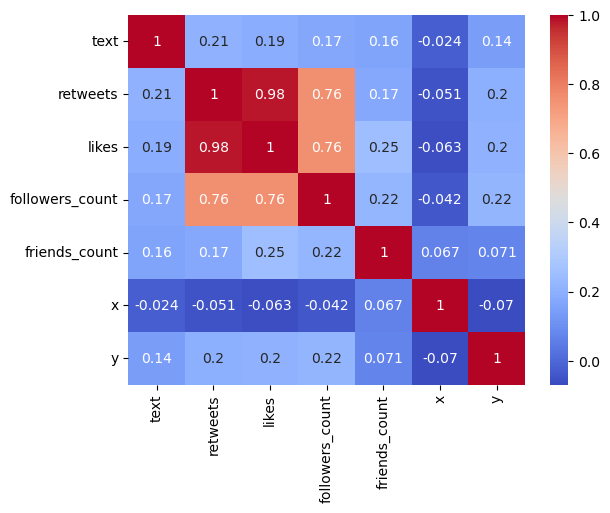

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

sen_pop_aux = sen_pop[["text","retweets","likes","followers_count","friends_count","x","y","State"]]

# calculate the correlation coefficients between the columns
corr_matrix = sen_pop_aux.corr()

# plot the correlation matrix using seaborn's heatmap function
sns.heatmap(corr_matrix, annot=True,cmap = "coolwarm")

# show the plot
plt.show()

## Popularity equation
Our own popularity expression is based on the metrics that are more correlated. It is undeniable that the number of likes and retweets accurately represents the number of interactions; however, to maintain the proportion and to penalize having many tweets with few interactions, we decided to divide by the total number of tweets.

We have also observed a significant correlation between followers count and the number of interactions with the tweet. In order to take into consideration for that metric as well, we decided to add a factor the equation.

$ popularity = \frac{rt+likes+0.25\cdot followers}{tweets}$

In [27]:
# Compute popularity
sen_pop["popularity"] = ((sen_pop["retweets"]+sen_pop["retweets"]+0.25*sen_pop["followers_count"])/sen_pop["text"])
sen_pop = sen_pop.sort_values(by='popularity', ascending=False)


# Normalization with respect to the max
sen_pop["popularity"] = sen_pop["popularity"]/sen_pop["popularity"].max()
sen_pop.head()

most_pop = sen_pop.iloc[0]
all_sen_pop= sen_pop

This figure represents the Senators with the higher popularity grouped by party. Bernie Sanders is the most popular Senator with a big difference from the second Jon Ossof. It is also clear to see that this popularity metric gives a few senators much more score than the rest. In the figure we plot the mean value of the popularity in a dark line. Note that we eliminate some of the least popular members of the Senate for the sake of a better visualization

In [28]:
sen_pop = sen_pop.loc[(sen_pop.Party.isin(['Democratic', 'Republican']))]


fig = px.bar(all_sen_pop[all_sen_pop["popularity"]>0.05], x=all_sen_pop[all_sen_pop["popularity"]>0.05].index, 
             y='popularity',color="Party",
             color_discrete_sequence=[ '#1f77b4','#d62728'])

fig.update_layout(
    xaxis_title="Senator",
    xaxis_tickangle=-90,
    xaxis  = dict(tickmode = "linear", tickfont = dict(size=14)),
    yaxis_title = "Popularity",
)
fig.update_traces(width=0.5)
fig.show()

### Comparative Popularity vs Followers

Observe the difference between Popularity and Followers. Specially Elizabeth Warren, who seems to be less relevant in her publications than other colleagues

In [29]:
from plotly.subplots import make_subplots


fig2 = px.bar(all_sen_pop[all_sen_pop["popularity"]>0.05], x=all_sen_pop[all_sen_pop["popularity"]>0.05].index, 
             y='popularity',color="Party",
             color_discrete_sequence=[ '#1f77b4','#d62728'])

fig2.update_layout(
    xaxis_title="Senator",
    xaxis_tickangle=-90,
    xaxis  = dict(tickmode = "linear"),
    yaxis_title = "Popularity"
)

fig2.update_traces(width=0.5)

mean = all_sen_pop["popularity"].describe()["mean"]


fig2.add_shape(type="line",
              x0=0,
              y0=mean,
              x1=1,
              y1=mean,
              line=dict(color="black", width=2, dash="dash"),
              xref="paper",
              yref="y")


#fig2.show()

fig = px.bar(all_sen_pop[all_sen_pop["popularity"]>0.05].sort_values(by="popularity",ascending=False), x=all_sen_pop[all_sen_pop["popularity"]>0.05].sort_values(by="popularity",ascending=False).index, 
             y='followers_count',
             color="Party",
             color_discrete_sequence=[ '#1f77b4','#d62728'])
             
fig.update_layout(
    xaxis_title="Senator",
    xaxis_tickangle=-90,
    xaxis  = dict(tickmode = "linear"),
    yaxis_title = "Followers"
)

fig.update_traces(width=0.5)


mean = all_sen_pop["followers_count"].describe()["mean"]


fig.add_shape(type="line",
              x0=0,
              y0=mean,
              x1=1,
              y1=mean,
              line=dict(color="black", width=2, dash="dash"),
              xref="paper",
              yref="y")
#fig.show()

In [30]:
subp = make_subplots(rows=1, cols=2, horizontal_spacing=0.05)

subp.add_trace(fig2.data[0], row=1, col=1)
subp.add_trace(fig2.data[1], row=1, col=1)
## Add mean

subp.add_trace(fig.data[0], row=1, col=2)
subp.add_trace(fig.data[1], row=1, col=2)

subp.update_layout(
    xaxis=dict(tickmode="linear"),
    yaxis=dict(tickmode="linear"),
    xaxis2=dict(tickmode="linear"),
    #yaxis2=dict(tickmode="linear"),
    xaxis_tickangle=-90,
    xaxis2_tickangle=-90,
    title="Senators sorted by popularity and by number of followers",
    xaxis_title_text="Popularity",
    #xaxis2_title_text="Senator",
    xaxis2_title_text="Followers",
    title_font_size=20,
    legend=dict(title_text="Party", title_font_size=16),
    width=1500, height=500
)

mean = all_sen_pop["popularity"].describe()["mean"]
mean2 = all_sen_pop["followers_count"].describe()["mean"]

# Add means
subp.add_shape(dict(type="line", x0=-0.5, x1=31.5, y0=mean, y1=mean, line_color="black", line_width=2.5), row="all", col=1)
subp.add_shape(dict(type="line", x0=-0.5, x1=31.5, y0=mean2, y1=mean2, line_color="black", line_width=2.5), row="all", col=2)

subp.update_layout(showlegend=False)

With this figure we can compare the popularity and the followers relation for each senator. It is obvioues that it is somehow related but is more complete if we take into account more factors not just the followers.

In [31]:

fig = px.scatter(sen_pop.dropna(), x="retweets", 
                 y="likes", 
                 #marginal_x="histogram", 
                 #marginal_y="histogram",
                 color="Party",
                 title='Plot of the likes against the retweets of the US Senate', 
                 hover_data=[sen_pop.dropna().index],
                 size='popularity',
                 color_discrete_sequence=[ '#1f77b4','#d62728'])
fig.show()

In [32]:
fig = px.scatter(sen_pop.dropna(), x="followers_count", 
                 y="retweets", 
                 #marginal_x="histogram", 
                 #marginal_y="histogram",
                 color="Party",
                 size='popularity',
                 hover_data=[sen_pop.dropna().index],
                 title = "Retweets-Followers and popularity",
                 color_discrete_sequence=[ '#1f77b4','#d62728'])
fig.show()

The figures represent each senator in relation with its retweets, likes and followers.

In the figures above we can see that it is more consistent to take into account likes and retweets because the metrics are more correlated than the followers. The size of the dots its proportional to the popularity of the senators.

### Most popular Senator: Bernie Sanders

We have selected the most popular senator, Bernie Sanders and decided to analyze him just by himself.

Between his statistics we can outline:

* Tweets:                       3008
* retweets:                8.5M
* likes:                  +46M
* Party:              Independent[n]
* followers:          +12.4M
* friends_count                2304

In [33]:
most_pop_sen = df.loc[(df["Senator"]=="Bernie Sanders") & (df.topic_assigned !='Unclassified')]
most_pop_sen["rt+likes"] = most_pop_sen["retweets"]+most_pop_sen["likes"]

most_pop_sen = most_pop_sen.sort_values(by='rt+likes', ascending=False)

#pie_chart(most_pop_sen)




fig = px.scatter(most_pop_sen.dropna(), x="retweets", 
                 y="likes", 
                 #marginal_x="histogram", 
                 #marginal_y="histogram",
                 color="topic_assigned",
                 color_discrete_sequence=px.colors.qualitative.Set2,
                 size='rt+likes',
                 labels = {
                     "topic_assigned":"Topic"
                 })


fig.show()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



This figures shows the percentage of tweets about different topics and the most popular topics taking into account retweets and likes.

##Map


In [34]:
import networkx as nx
# sen_pop = sen_pop.dropna()
relationships = pd.read_csv("/kaggle/input/us-senate-analysis/relationships.csv")

def build_graph():
  # Directed graph (edges have direction)
  G = nx.DiGraph()
  relationships = pd.read_csv('/kaggle/input/us-senate-analysis/relationships.csv')

  for index, row in relationships.iterrows():
    if row["relationship"] == "following":
      G.add_edge(row["person1"],row["person2"])
      G.add_edge(row["person2"],row["person1"])
    elif row["relationship"] == "following only by person1":
      G.add_edge(row["person1"],row["person2"])
    elif row["relationship"] == "following only by person2":
      G.add_edge(row["person2"],row["person1"])

  return G
G = build_graph()

def assign_network_properties(df, G):
  properties= ['followers_count', 'friends_count', 'x', 'y', 'Party', 'State']
  # Twitter attributes
  for item in properties:
    nx.set_node_attributes(G, df.set_index("name")[item].to_dict(), item)
  return G

aux_senators = pd.read_csv("/kaggle/input/us-senate-analysis/us_senators.csv")
aux_senators.loc[aux_senators["Party"].isin(['Independent[d]','Independent[n]', 'Democratic (DFL)[p]']), "Party"] = "Democratic"

G = assign_network_properties(aux_senators, G)

import pickle
# save the graph as a pickled file
with open("senators.pickle", "wb") as f:
    pickle.dump(G, f)

### Senators map by popularity

In [35]:
# all_sen_pop = all_sen_pop.drop("Pete Ricketts")
# # all_sen_pop=all_sen_pop.dropna()
# all_sen_pop = all_sen_pop.replace("Katie Britt for AL", "Katie Britt")
all_sen_pop = all_sen_pop.dropna(subset=['popularity'])
# plot nodes
fig = px.scatter_mapbox(all_sen_pop,
                        lat='x',
                        lon='y',
                        color="Party",
                        hover_name=all_sen_pop.index,
                        hover_data=['screen_name', 'State', 'followers_count', 'friends_count'],
                        color_discrete_map={'Independent': 'blue','Republican': 'red', 'Democratic': 'blue'},
                        size="popularity",
                        title="Senators map",
                        mapbox_style="carto-positron",
                        zoom=3)

edge_x, edge_y, party_origin = [], [], []
for edge in G.edges():
    #if 'Leader McConnell' in edge:
      #print(edge)
      #print(G.nodes[edge[0]]['x'], G.nodes[edge[0]]['y'])
      #print(G.nodes[edge[1]]['x'], G.nodes[edge[1]]['y'])
    x0, y0 = G.nodes[edge[0]]['x'], G.nodes[edge[0]]['y']
    x1, y1 = G.nodes[edge[1]]['x'], G.nodes[edge[1]]['y']
    party_origin.append(G.nodes[edge[0]]['Party'])
    party_origin.append(G.nodes[edge[0]]['Party'])
    party_origin.append(G.nodes[edge[0]]['Party'])
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

data = pd.DataFrame({'x': edge_x, 'y': edge_y, 'Party': party_origin})
fig.add_trace(go.Scattermapbox(name= 'Republican Follows', lat=data[data.Party == 'Republican'].x.to_list(), lon=data[data.Party == 'Republican'].y.to_list(),
                                    mode='lines', line=dict(color='#EB9988', width=0.01)))
fig.data[-1]['showlegend'] = True
fig.add_trace(go.Scattermapbox(name= 'Democratic Follows', lat=data[data.Party == 'Democratic'].x.to_list(), lon=data[data.Party == 'Democratic'].y.to_list(),
                                mode='lines', line=dict(color='#A3EBFB', width=0.01)))
fig.data[-1]['showlegend'] = True
fig.add_trace(go.Scattermapbox(name= 'Rest of Follows', lat=data[data.Party.isin(['Democratic', 'Republican']) == False].x.to_list(),
                                lon=data[data.Party.isin(['Democratic', 'Republican']) == False].y.to_list(),
                                mode='lines', line=dict(color='#A7A7A7', width=0.01)))
fig.data[-1]['showlegend'] = True

fig.update_traces(line=dict(width=0.001))
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.update_layout(annotations=[dict(
                        text="OSNA: Spring 2023, Miguel Cozar and Carlos Munoz",
                        showarrow=False,
                        xref="paper", yref="paper",
                        x=0.005, y=-0.002)],
    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    title = 'US Senators Twitter Analysis',
    titlefont_size = 16
)
# if save:
#     self.save_network_representation(fig, name)
# if show:
fig.show()




This maps represents all the senators and their connections in tweeter in their location an with a circle with proportinal size with his popularity.

### Most popular senators map

In [36]:

n_senators = 20

# plot nodes
fig = px.scatter_mapbox(sen_pop.iloc[:n_senators],
                        lat='x',
                        lon='y',
                        color="Party",
                        hover_name=sen_pop.iloc[:n_senators].index,
                        hover_data=['screen_name', 'State', 'followers_count', 'friends_count'],
                        color_discrete_map={'Republican': 'red', 'Democratic': 'blue'},
                        size="popularity",
                        title="Senators map",
                        mapbox_style="carto-positron",
                        zoom=4)


edge_x, edge_y, party_origin = [], [], []
for edge in G.edges():
    if edge[0] in sen_pop.iloc[:n_senators].name_y.to_list() and edge[1] in sen_pop.iloc[:n_senators].name_y.to_list():
      x0, y0 = G.nodes[edge[0]]['x'], G.nodes[edge[0]]['y']
      x1, y1 = G.nodes[edge[1]]['x'], G.nodes[edge[1]]['y']
      party_origin.append(G.nodes[edge[0]]['Party'])
      party_origin.append(G.nodes[edge[0]]['Party'])
      party_origin.append(G.nodes[edge[0]]['Party'])
      edge_x.append(x0)
      edge_x.append(x1)
      edge_x.append(None)
      edge_y.append(y0)
      edge_y.append(y1)
      edge_y.append(None)

data = pd.DataFrame({'x': edge_x, 'y': edge_y, 'Party': party_origin})
fig.add_trace(go.Scattermapbox(name= 'Republican Follows', lat=data[data.Party == 'Republican'].x.to_list(), lon=data[data.Party == 'Republican'].y.to_list(),
                                    mode='lines', line=dict(color='#EB9988', width=0.1)))
fig.data[-1]['showlegend'] = True
fig.add_trace(go.Scattermapbox(name= 'Democratic Follows', lat=data[data.Party == 'Democratic'].x.to_list(), lon=data[data.Party == 'Democratic'].y.to_list(),
                                mode='lines', line=dict(color='#A3EBFB', width=0.1)))
fig.data[-1]['showlegend'] = True
fig.add_trace(go.Scattermapbox(name= 'Rest of Follows', lat=data[data.Party.isin(['Democratic', 'Republican']) == False].x.to_list(),
                                lon=data[data.Party.isin(['Democratic', 'Republican']) == False].y.to_list(),
                                mode='lines', line=dict(color='#A7A7A7', width=0.1)))
fig.data[-1]['showlegend'] = True

fig.update_traces(line=dict(width=1))
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.update_layout(annotations=[dict(
                        text="OSNA: Spring 2023, Miguel Cozar and Carlos Munoz",
                        showarrow=False,
                        xref="paper", yref="paper",
                        x=0.005, y=-0.002)],
    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    title = 'US Senators Twitter Analysis',
    titlefont_size = 16
)
# if save:
#     self.save_network_representation(fig, name)
# if show:
fig.show()




In this map we have filtered all the senators to the 15 most popular ones so it is easier to see the connections between the most influential senators. This way we could study the influence between senators and how they can relate to each other.

# Stuff for the paper

### Comparative of \#topics per party and \#popularity of the topics per party 

In [37]:
# Concatenate the two data frames
combined_df = pd.concat([democratic_topic_pop, republican_topic_pop])
x = df.loc[(df.Party.isin(['Democratic', 'Republican']) & (df.topic_assigned.isin(['Unclassified', 'Others']) == False))]




# Fig1: popularity
pop = px.histogram(combined_df, x=combined_df.index, y='popularity', color='Party', nbins=len(x['topic_assigned'].unique()),
             color_discrete_sequence=['#1f77b4', '#d62728'], category_orders={'Party': ['Democratic', 'Republican'], 'topic_assigned': combined_df.index.unique()})

pop.update_layout(barmode='group',
                  bargap=0.5, bargroupgap=0.1, 
                  )
pop.update_traces(marker_line_width=0.2)


# Fig2: #tweets
ntw = px.histogram(x, x='topic_assigned', color='Party', nbins=len(x['topic_assigned'].unique()), 
                   color_discrete_sequence=['#1f77b4', '#d62728'], category_orders={'Party': ['Democratic', 'Republican'], 'topic_assigned': combined_df.index.unique()})

ntw.update_layout(barmode='group',
                  bargap=0.5, bargroupgap=0.1, 
                  )
ntw.update_traces(marker_line_width=0.2)

#

In [38]:
# Create the bar chart for popularity
fig1 = px.bar(combined_df, x=combined_df.index, y='popularity', color='Party', 
              color_discrete_sequence=['#1f77b4', '#d62728'], 
              category_orders={'topic_assigned': sorted(df['topic_assigned'].unique())})
fig1.update_layout(xaxis={'categoryorder': 'array', 'categoryarray': sorted(df['topic_assigned'].unique())},
                   yaxis_title='Popularity')

# Create the bar chart for number of tweets
fig2 = px.bar(x, x='topic_assigned', y='Count', color='Party', 
              color_discrete_sequence=['#1f77b4', '#d62728'], 
              category_orders={'topic_assigned': sorted(df['topic_assigned'].unique())})
fig2.update_layout(xaxis={'categoryorder': 'array', 'categoryarray': sorted(df['topic_assigned'].unique())},
                   yaxis_title='# Tweets')

# Combine the two charts into a subplot
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1)
fig.add_trace(fig1.data[0], row=1, col=1)
fig.add_trace(fig1.data[1], row=1, col=1)
fig.add_trace(fig2.data[0], row=2, col=1)
fig.add_trace(fig2.data[1], row=2, col=1)

# Update subplot layout
fig.update_layout(title='Topics by Popularity and Number of Tweets', 
                  legend_title='Party', #legend=dict(yanchor="top", y=1.05, xanchor="left", x=0.01),
                  height=600, width=1000)
fig.show()